# Машинное обучение

# Домашнее задание 2. Обучение без учителя, кластеризация.

## Общая информация
Дата выдачи: 02.10.2025

Дедлайн: 16.10.2025 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи).

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.


## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

seed = 0xFFFFFFF
np.random.seed(seed)

## Часть 1. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [ ]:
!unzip archive\ \(1\).zip

Archive:  archive (1).zip
  inflating: bbc-news-data.csv       


In [ ]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1289,politics,394.txt,Economy focus for election battle,Britain's economic future will be at the hear...
1872,tech,049.txt,Domain system scam fear,A system to make it easier to create website ...
1044,politics,149.txt,Blair returns from peace mission,Prime Minister Tony Blair has arrived back fr...
654,entertainment,145.txt,Sir Paul rocks Super Bowl crowds,Sir Paul McCartney wowed fans with a live min...
134,business,135.txt,Feta cheese battle reaches court,A row over whether only Greece should be allo...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [ ]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt_tab')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [ ]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [ ]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [ ]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

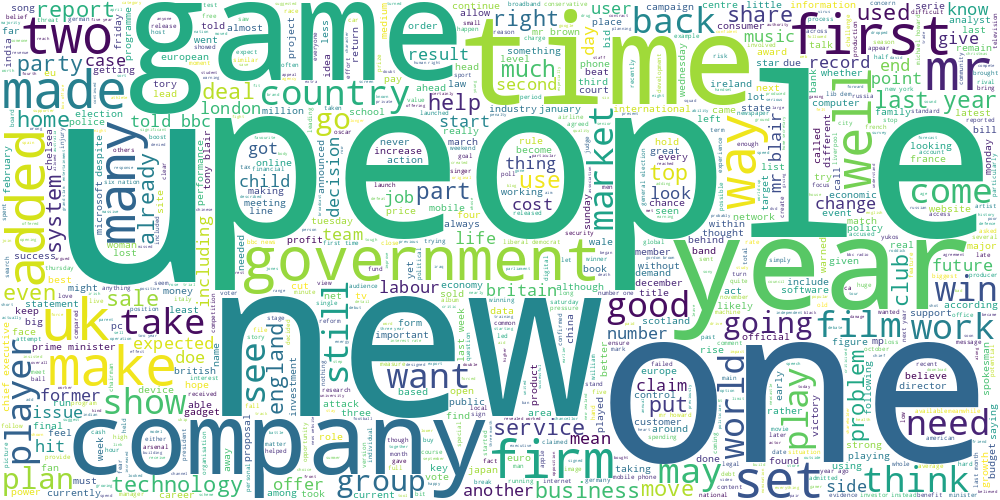

In [ ]:
draw_wordcloud(data.text)

**Задание 1.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**

In [ ]:
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
text_data = data["text"]

In [ ]:
vect = TfidfVectorizer(min_df=3, max_df=0.8)
text_data = vect.fit_transform(text_data)

In [ ]:
text_data.shape

(2225, 10959)

In [ ]:
estim = KMeans()
estim.fit(text_data)

KMeans()

In [ ]:
clusters = np.unique(estim.labels_)
clusters

array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int32)

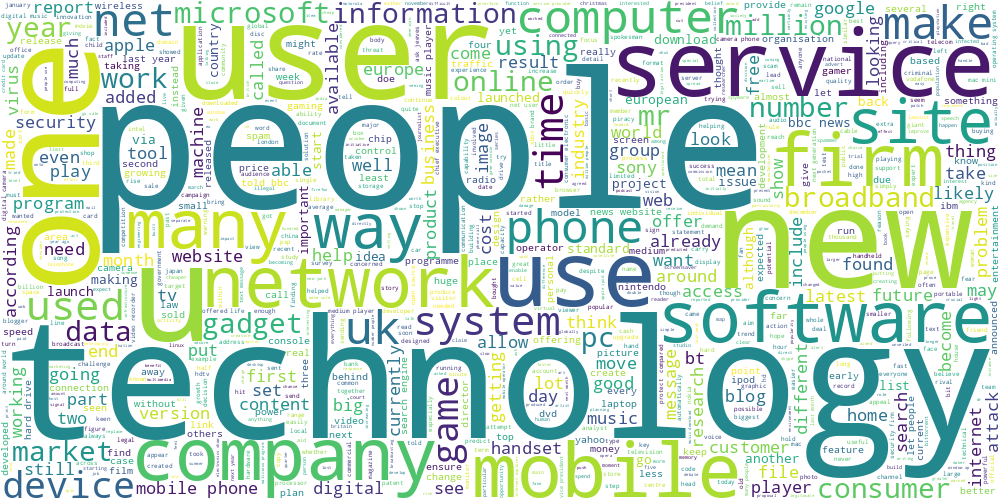

In [ ]:
draw_wordcloud(data["text"][estim.labels_ == clusters[0]], width=1000, height=500)

Этот кластер как-будто про технологии

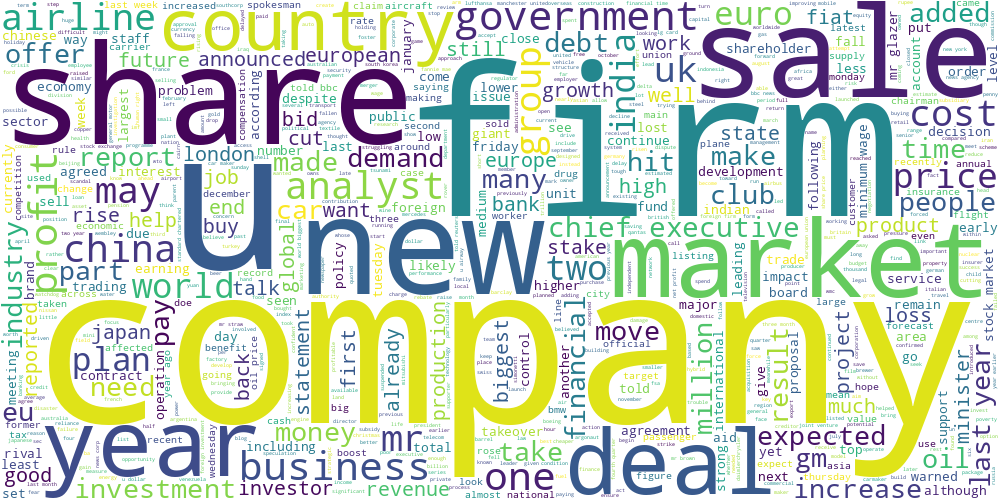

In [ ]:
draw_wordcloud(data["text"][estim.labels_ == clusters[1]], width=1000, height=500)

Этот кластер про международный бизнес, видим много стран, слова связанные с бизнесом

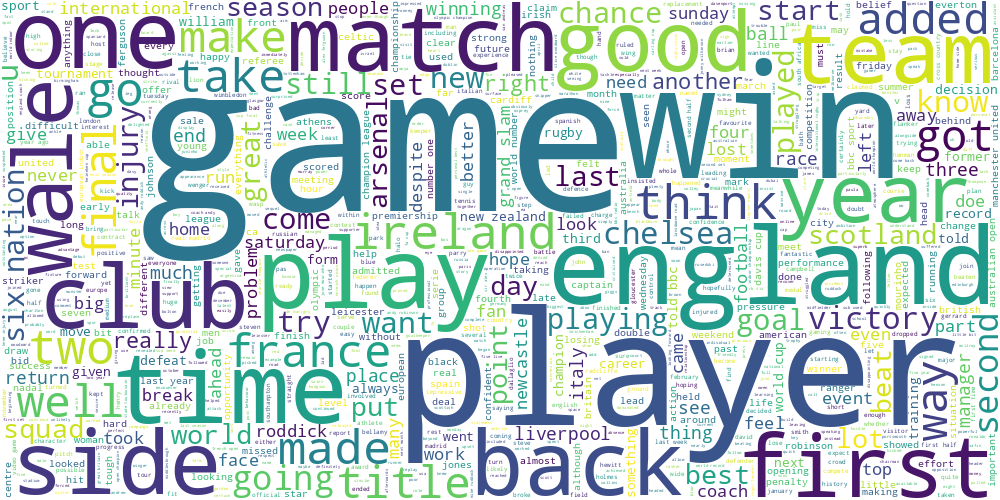

In [ ]:
draw_wordcloud(data["text"][estim.labels_ == clusters[2]], width=1000, height=500)

Этот кластер про спорт, видим много слов, связанных с играми и спортом

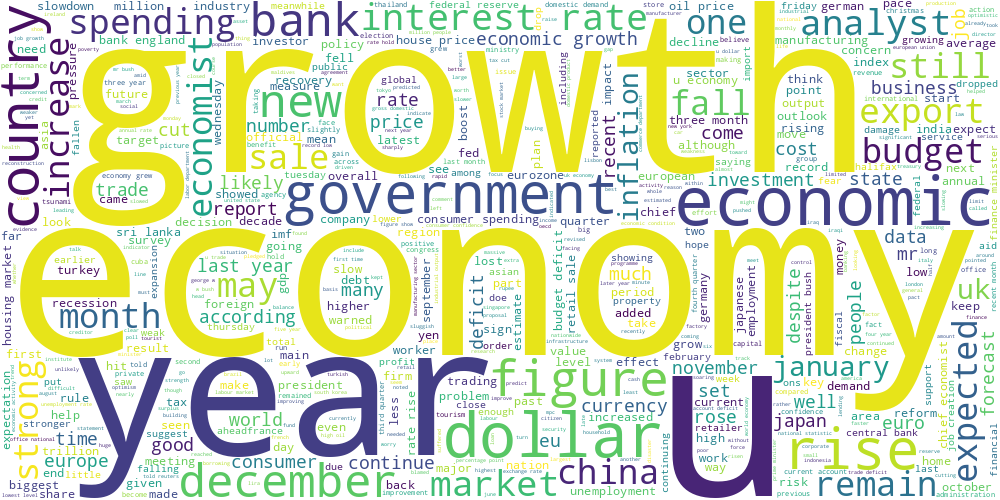

In [ ]:
draw_wordcloud(data["text"][estim.labels_ == clusters[3]], width=1000, height=500)

Этот кластер про экономику

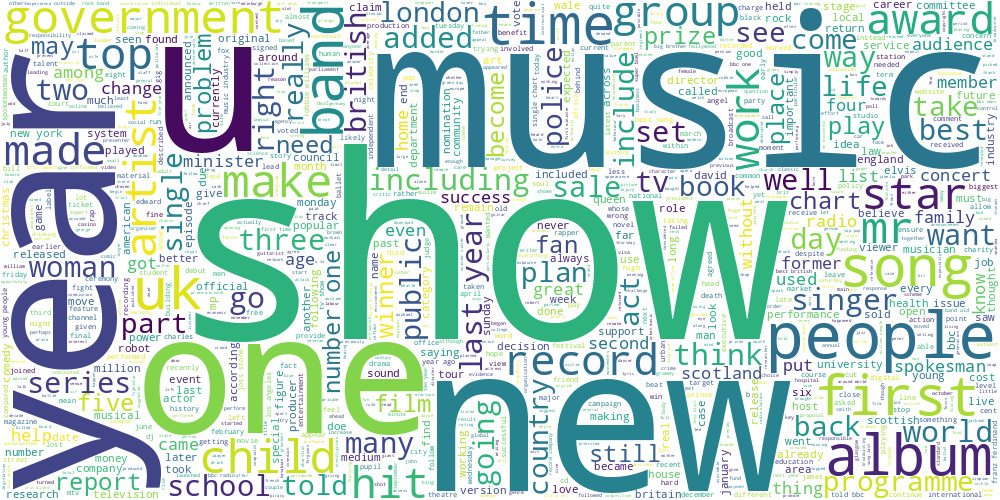

In [ ]:
draw_wordcloud(data["text"][estim.labels_ == clusters[4]], width=1000, height=500)

Этот кластер похож на тематику шоу талантов

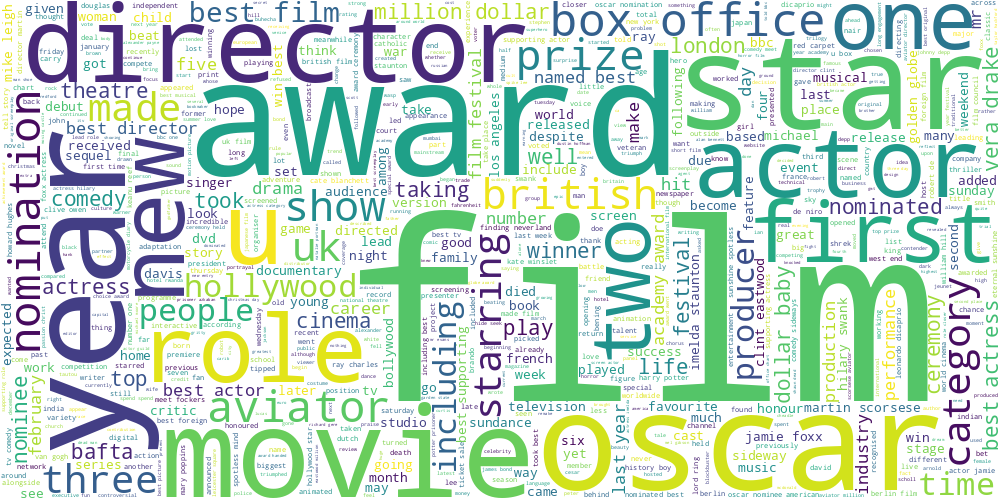

In [ ]:
draw_wordcloud(data["text"][estim.labels_ == clusters[5]], width=1000, height=500)

Этот кластер про кинематограф

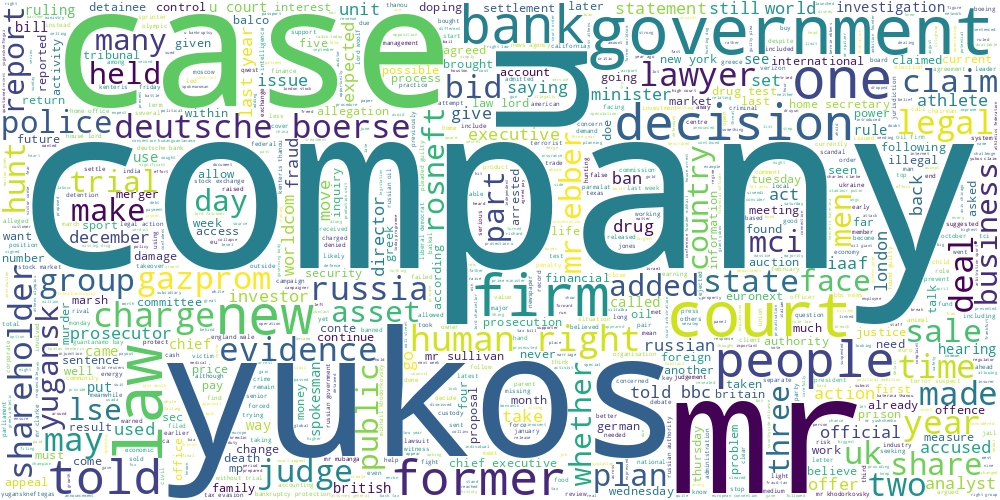

In [ ]:
draw_wordcloud(data["text"][estim.labels_ == clusters[6]], width=1000, height=500)

Тут не очень понятно разделение, предположе, что этот кластер про правительство (тут ещё есть слова про бизнес, что усложняет разделение)

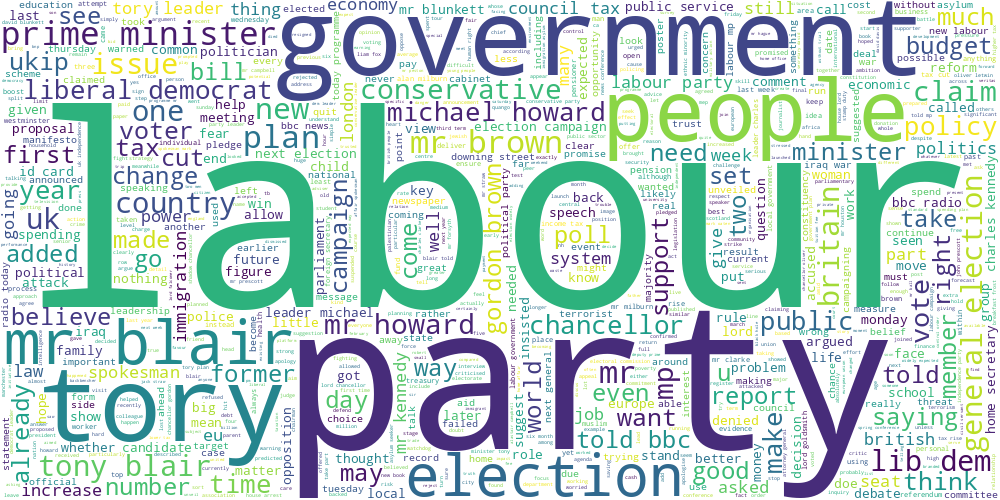

In [ ]:
draw_wordcloud(data["text"][estim.labels_ == clusters[7]], width=1000, height=500)

Этот кластер тоже связан с правительством, но в отличие от прошлого, в этом кластере больше говорится про выборы

**Задание 1.2 (1 балл).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:**

In [ ]:
centers = estim.cluster_centers_
features = vect.get_feature_names_out()

In [ ]:
for i in range(centers.shape[0]):
  top_idx = np.argsort(centers[i])[::-1][:10]
  print(f"Cluster {i} top features: {features[top_idx]}")

Cluster 0 top features: ['mobile' 'phone' 'technology' 'people' 'user' 'service' 'software'
 'computer' 'digital' 'net']
Cluster 1 top features: ['company' 'share' 'firm' 'profit' 'market' 'sale' 'year' 'airline'
 'price' 'deal']
Cluster 2 top features: ['game' 'england' 'player' 'win' 'match' 'cup' 'team' 'champion' 'injury'
 'play']
Cluster 3 top features: ['economy' 'growth' 'rate' 'economic' 'bank' 'dollar' 'year' 'figure'
 'deficit' 'price']
Cluster 4 top features: ['music' 'show' 'band' 'album' 'year' 'chart' 'song' 'award' 'star' 'tv']
Cluster 5 top features: ['film' 'award' 'best' 'oscar' 'actor' 'festival' 'actress' 'director'
 'star' 'movie']
Cluster 6 top features: ['yukos' 'court' 'mr' 'law' 'bank' 'case' 'company' 'drug' 'government'
 'lord']
Cluster 7 top features: ['mr' 'labour' 'election' 'party' 'blair' 'tory' 'brown' 'tax' 'would'
 'government']


Да, можем видеть, что слова согласуются с облаком тегов, даже становистя понятнее разделение.

**Задание 1.3 (2 балла).** Посмотрим на кластеризацию для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [ ]:
from sklearn.cluster import SpectralClustering, DBSCAN

In [ ]:
kmeans = KMeans(n_clusters=5)
dbscan = DBSCAN(eps=1.265)
spec_cl = SpectralClustering(n_clusters=5)
kmeans.fit(text_data)
dbscan.fit(text_data)
spec_cl.fit(text_data)

SpectralClustering(n_clusters=5)

In [ ]:
print(np.unique(kmeans.labels_))
print(np.unique(dbscan.labels_))
print(np.unique(spec_cl.labels_))

[0 1 2 3 4]
[-1  0  1  2  3  4]
[0 1 2 3 4]


In [ ]:
from sklearn.manifold import TSNE

In [ ]:
tsne = TSNE()
transformed_data = tsne.fit_transform(text_data.toarray())

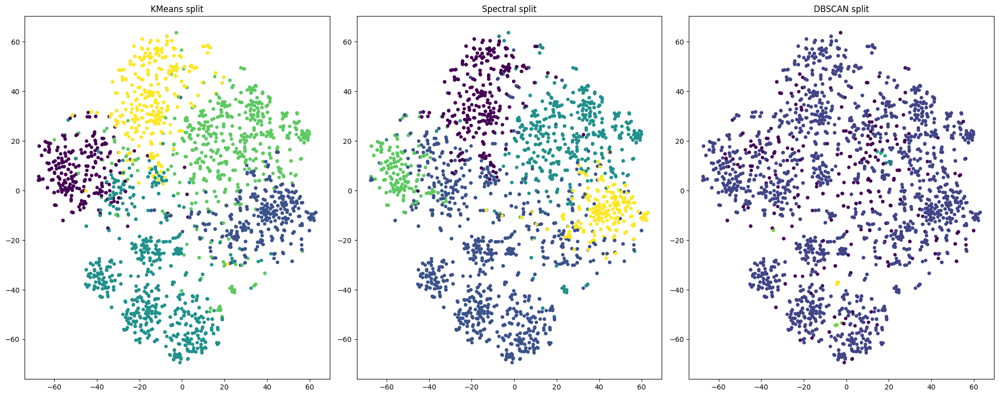

In [ ]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=kmeans.labels_, s=16)
plt.title("KMeans split")
plt.subplot(1, 3, 2)
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=spec_cl.labels_, s=16)
plt.title("Spectral split")
plt.subplot(1, 3, 3)
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=dbscan.labels_, s=16)
plt.title("DBSCAN split")

plt.tight_layout()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:**

Можем видеть, что все алгоритмы сделали разное разбиение, но сразу видно, что DBSCAN спарвился хуже всех, видимо из-за того, что данные расположены слишком близко, поэтому какой-бы `eps` не ставили, разделение будет такое себе, а остальные алгоритмы справились очень неплохо, даже получили почти одинаковые разибения.

**Задание 1.4 (2 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:**

Действительно, темы стали более узконаправлены, но появилось так же много малоинформативных тем, что потребовало сделать фильтрацию, с большим объёмом компонент задача усложняется в разы.

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
cv = CountVectorizer()
cv_text = cv.fit_transform(data["text"])

In [ ]:
lda = LatentDirichletAllocation(n_components=16)
lda.fit(cv_text)

LatentDirichletAllocation(n_components=16)

In [ ]:
topic_dist = lda.transform(cv_text)
lda_labels = np.argmax(topic_dist, axis=1)

In [ ]:
lda_clusters = np.arange(16, dtype=int)
lda_clusters

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15])

In [ ]:
lda_centers = lda.components_
lda_features = cv.get_feature_names_out()
for i in range(lda_centers.shape[0]):
  top_idx = np.argsort(lda_centers[i])[::-1][:10]
  print(f"Cluster {i} top features:")
  print(lda_features[top_idx])

Cluster 0 top features:
['yukos' 'company' 'court' 'russian' 'firm' 'dvd' 'oil' 'mr' 'russia'
 'sale']
Cluster 1 top features:
['game' 'england' 'win' 'first' 'world' 'player' 'year' 'time' 'match'
 'back']
Cluster 2 top features:
['film' 'best' 'award' 'year' 'star' 'actor' 'show' 'also' 'director'
 'oscar']
Cluster 3 top features:
['software' 'security' 'mr' 'program' 'user' 'microsoft' 'virus' 'company'
 'system' 'new']
Cluster 4 top features:
['chelsea' 'patent' 'side' 'cup' 'manager' 'club' 'mourinho' 'southampton'
 'play' 'player']
Cluster 5 top features:
['game' 'gaming' 'nintendo' 'mini' 'get' 'one' 'mac' 'world' 'pc' 'year']
Cluster 6 top features:
['people' 'technology' 'mobile' 'phone' 'digital' 'game' 'music' 'new'
 'also' 'tv']
Cluster 7 top features:
['mr' 'would' 'labour' 'election' 'party' 'blair' 'tory' 'minister'
 'people' 'brown']
Cluster 8 top features:
['government' 'mr' 'would' 'eu' 'people' 'party' 'could' 'european'
 'country' 'also']
Cluster 9 top features:
['g

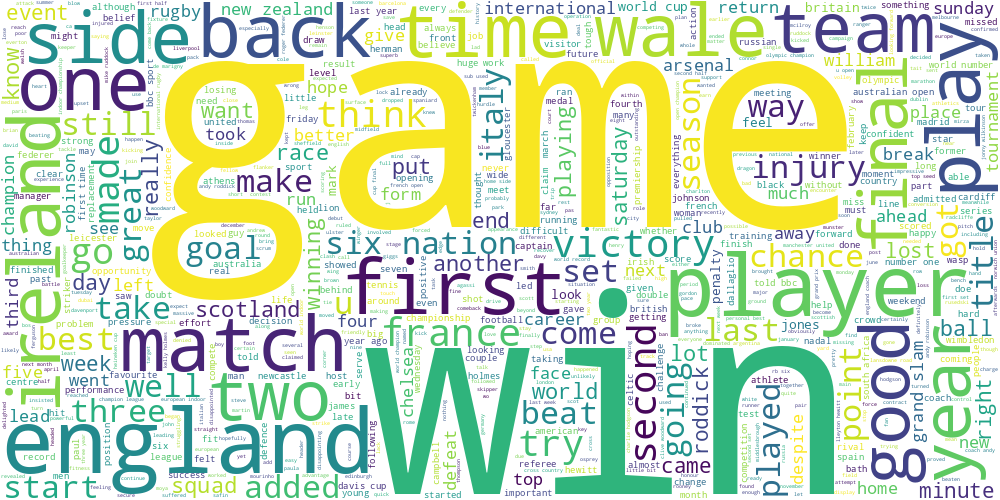

In [ ]:
draw_wordcloud(data["text"][lda_labels == lda_clusters[1]], width=1000, height=500)

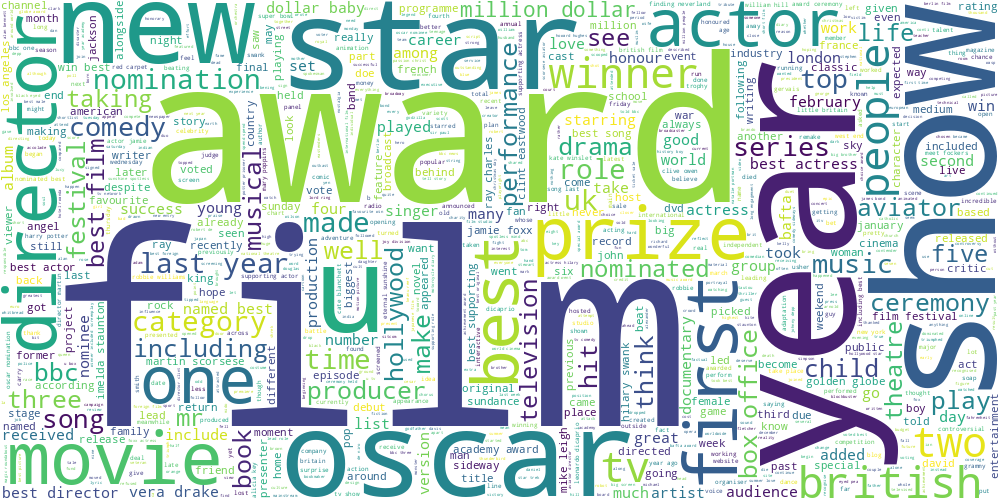

In [ ]:
draw_wordcloud(data["text"][lda_labels == lda_clusters[2]], width=1000, height=500)

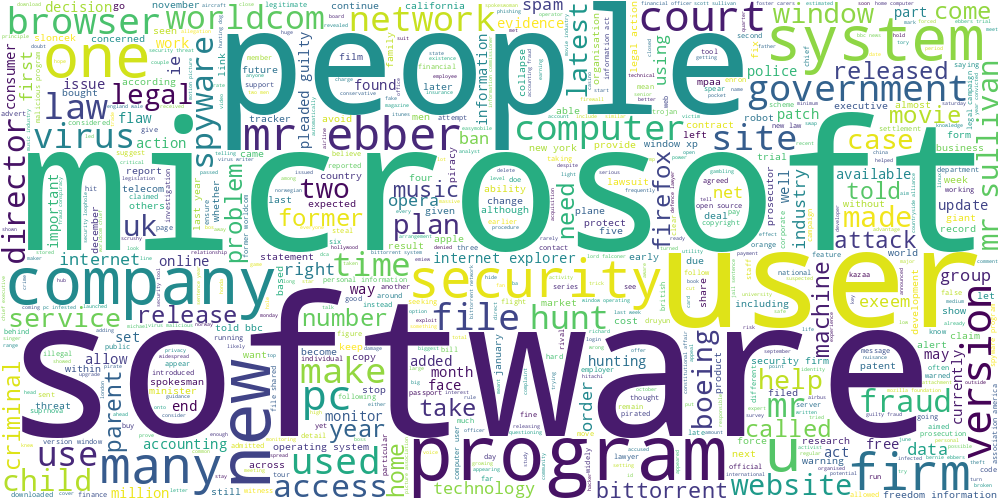

In [ ]:
draw_wordcloud(data["text"][lda_labels == lda_clusters[3]], width=1000, height=500)

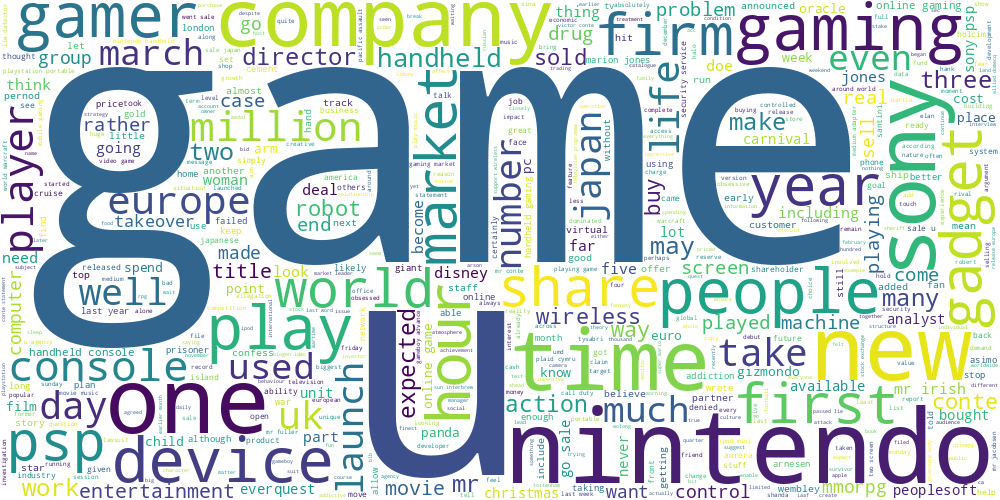

In [ ]:
draw_wordcloud(data["text"][lda_labels == lda_clusters[5]], width=1000, height=500)

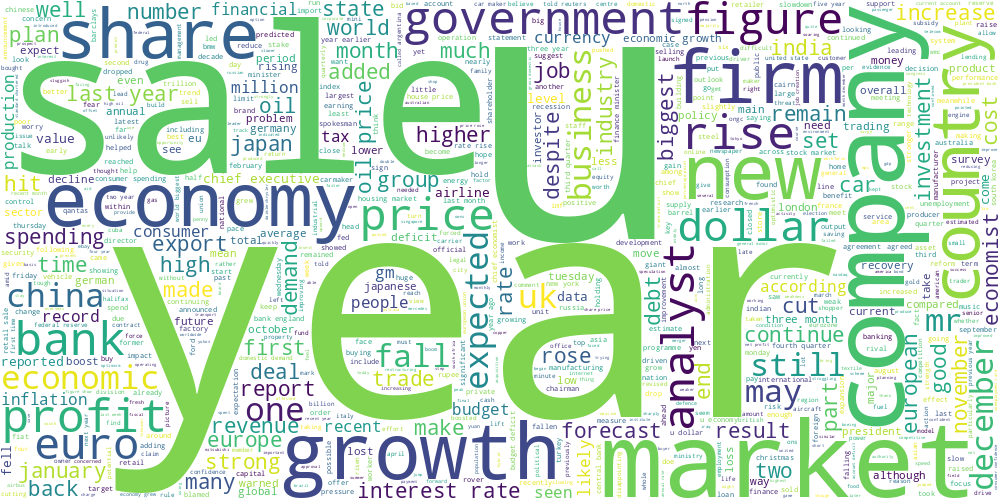

In [ ]:
draw_wordcloud(data["text"][lda_labels == lda_clusters[10]], width=1000, height=500)

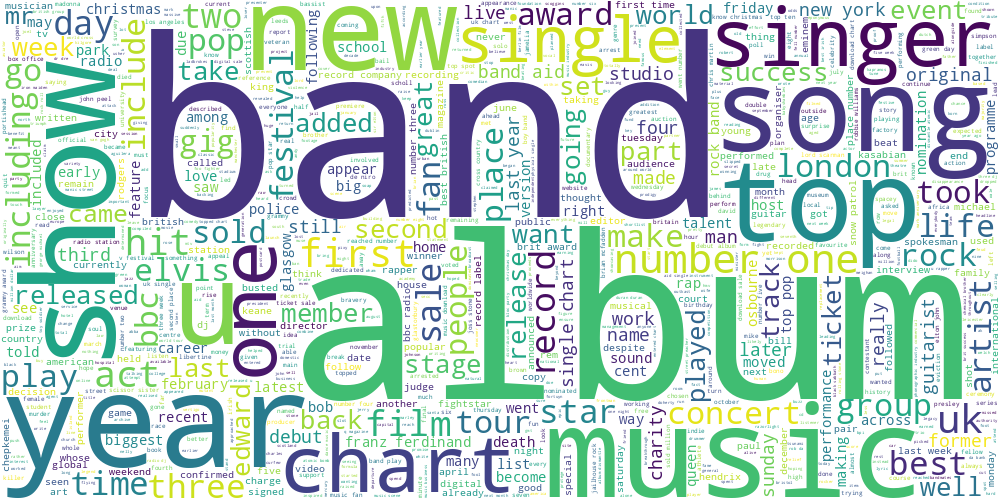

In [ ]:
draw_wordcloud(data["text"][lda_labels == lda_clusters[14]], width=1000, height=500)

## Часть 2. Transfer learning для задачи классификации текстов

**Задание 2.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score

In [ ]:
cv = CountVectorizer()
tfidf = TfidfVectorizer(min_df=3, max_df=0.8)
tfidf_text = tfidf.fit_transform(data["text"])
cv_text = cv.fit_transform(data["text"])

In [ ]:
data_idx = data.index.to_numpy()
train_idx, test_idx = train_test_split(data_idx, test_size=0.3, random_state=seed)

categories = sorted(data["category"].unique())
cat2id = {cat: i for i, cat in enumerate(categories)}
id2cat = {i: cat for i, cat in enumerate(categories)}

y_id = data["category"].map(cat2id)

X_train_tfidf, X_test_tfidf = tfidf_text[train_idx], tfidf_text[test_idx]
X_train_cv, X_test_cv = cv_text[train_idx], cv_text[test_idx]
y_id_train, y_id_test = y_id[train_idx], y_id[test_idx]

In [ ]:
metrics = [accuracy_score, roc_auc_score]

In [ ]:
from collections import defaultdict

def calculate_metrics(model, X_train, X_test, y_train, y_test, metrics):
  y_pred_proba_train = model.predict_proba(X_train)
  y_pred_proba_test = model.predict_proba(X_test)
  y_pred_train = model.predict(X_train)
  y_pred_test = model.predict(X_test)

  score_dict = defaultdict(list)
  score_dict["segm"] = ["train", "test"]
  for metric in metrics:
      metr_name = metric.__name__
      if metr_name == "roc_auc_score":
          train_score = metric(y_train, y_pred_proba_train, multi_class='ovr')
          test_score = metric(y_test, y_pred_proba_test, multi_class='ovr')
      else:
          train_score = metric(y_train, y_pred_train)
          test_score = metric(y_test, y_pred_test)
      score_dict[metr_name] = [train_score, test_score]
  return pd.DataFrame(score_dict)


In [ ]:
# logreg на tf-idf
lr = LogisticRegression(random_state=seed)
lr.fit(X_train_tfidf, y_id_train)
calculate_metrics(lr, X_train_tfidf, X_test_tfidf, y_id_train, y_id_test, metrics)

,segm,accuracy_score,roc_auc_score
0,train,0.995504,0.999943
1,test,0.980539,0.999161


In [ ]:
# kmeans и logreg
kmeans = KMeans(random_state=seed)
kmeans.fit(X_train_tfidf)

dist_train, dist_test = kmeans.transform(X_train_tfidf), kmeans.transform(X_test_tfidf)
lr_kmeans = LogisticRegression(random_state=seed)
lr_kmeans.fit(dist_train, y_id_train)

calculate_metrics(lr_kmeans, dist_train, dist_test, y_id_train, y_id_test, metrics)

,segm,accuracy_score,roc_auc_score
0,train,0.824021,0.991421
1,test,0.793413,0.990495


In [ ]:
# lda и logreg
lda = LatentDirichletAllocation(n_components=16, random_state=seed)
lda.fit(X_train_cv)

probs_train, probs_test = lda.transform(X_train_cv), lda.transform(X_test_cv)
lr_lda = LogisticRegression(random_state=seed)
lr_lda.fit(probs_train, y_id_train)

calculate_metrics(lr_lda, probs_train, probs_test, y_id_train, y_id_test, metrics)

,segm,accuracy_score,roc_auc_score
0,train,0.807163,0.962448
1,test,0.911677,0.990052


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:**

Лучшее качество получилось у обычного логрега, это может быть с вязано с тем, что у в данных была какая-то супер фича, по которой можно было хорошо линейно разделитсья, а когда мы делаем дополнительные преобразования мы просто теряем эту информацию, можем даже переобучиться, как мы видим на последней моделе.

**Задание 2.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации.

In [ ]:
train_labeled_idx, left_idx = train_test_split(train_idx, test_size=95/100)
train_unlabeled_idx, val_idx = train_test_split(left_idx, test_size=30/95)
new_train_idx = np.append(train_labeled_idx, train_unlabeled_idx)

idx2pos = {idx: pos for pos, idx in enumerate(new_train_idx)}
train_labeled_pos = np.array([idx2pos[idx] for idx in train_labeled_idx])
train_unlabeled_pos = np.array([idx2pos[idx] for idx in train_unlabeled_idx])

cv = CountVectorizer()
tfidf = TfidfVectorizer(min_df=3, max_df=0.8)
tfidf_text = tfidf.fit_transform(data["text"].loc[new_train_idx])
cv_text = cv.fit_transform(data["text"].loc[new_train_idx])

X_train_tfidf_labeled = tfidf_text[train_labeled_pos]
X_train_tfidf_unlabeled = tfidf_text[train_unlabeled_pos]
X_train_tfidf = tfidf_text
X_test_tfidf = tfidf.transform(data["text"].loc[test_idx])

X_train_cv_labeled = cv_text[train_labeled_pos]
X_train_cv_unlabeled = cv_text[train_unlabeled_pos]
X_train_cv = cv_text
X_test_cv = cv.transform(data["text"].loc[test_idx])

categories = sorted(data["category"].unique())
cat2id = {cat: i for i, cat in enumerate(categories)}
id2cat = {i: cat for i, cat in enumerate(categories)}

y_id = data["category"].map(cat2id)

y_id_train = y_id.loc[new_train_idx].to_numpy()
y_id_train_labeled = y_id.loc[train_labeled_idx].to_numpy()
y_id_train_unlabeled = y_id.loc[train_unlabeled_idx].to_numpy()
y_id_test = y_id.loc[test_idx].to_numpy()

In [ ]:
# kmeans и logreg
kmeans = KMeans(random_state=seed)
kmeans.fit(X_train_tfidf)

dist_train_labled, dist_train_unlabled, dist_test = kmeans.transform(X_train_tfidf_labeled), kmeans.transform(X_train_tfidf_labeled), kmeans.transform(X_test_tfidf)
lr_kmeans = LogisticRegression(random_state=seed)
lr_kmeans.fit(dist_train_labled, y_id_train_labeled)

calculate_metrics(lr_kmeans, dist_train_labled, dist_test, y_id_train_labeled, y_id_test, metrics)

,segm,accuracy_score,roc_auc_score
0,train,0.311688,0.994390
1,test,0.199102,0.980113


In [ ]:
# lda и logreg
lda = LatentDirichletAllocation(n_components=16, random_state=seed)
lda.fit(X_train_cv)

probs_train_labled, probs_train_unlabled, probs_test = lda.transform(X_train_cv_labeled), lda.transform(X_train_cv_unlabeled), lda.transform(X_test_cv)
lr_lda = LogisticRegression(random_state=seed)
lr_lda.fit(probs_train_labled, y_id_train_labeled)

calculate_metrics(lr_lda, probs_train_labled, probs_test, y_id_train_labeled, y_id_test, metrics)

,segm,accuracy_score,roc_auc_score
0,train,0.844156,0.975559
1,test,0.778443,0.975263


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:**

Сразу видно, что подход с lda+logreg показал себя лучше чем с kmeans, во-первых, ушло переобучение, а во-вторых метрики выше предыдущего подхода

**Задание 3 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 4 (1 балл)**. Есть такая метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿